In [213]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits import mplot3d

from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [215]:
df_scaled = pd.read_csv(r"C:\Users\Holly\OneDrive\David's work\project 1 machine learning\02 Data\Dataset-weather-prediction-dataset-processed_scaled.csv")

In [217]:
notemp = df_scaled.drop(['DATE','MONTH'], axis=1)

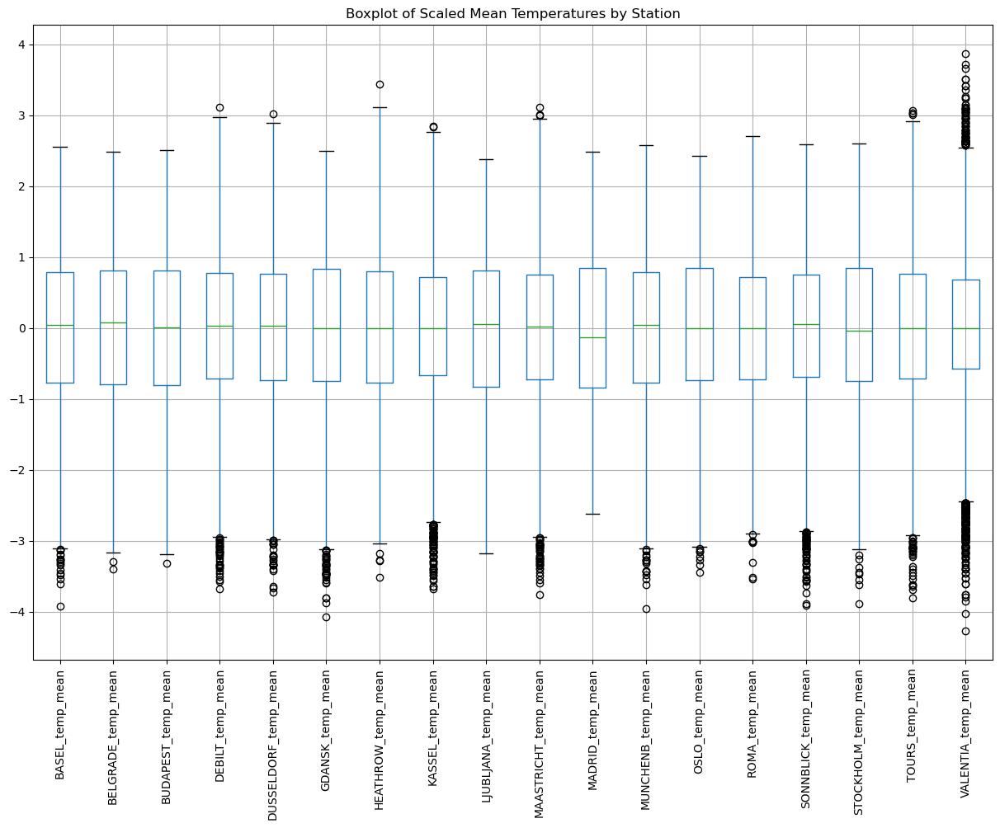

In [219]:
# Create a boxplot (a type of whisker plot) to show variation in temperatures
# across all stations. This helps us spot outliers and compare distributions.

# Filter the temp_mean columns for plotting
temp_cols = [col for col in notemp.columns if col.endswith("temp_mean")]

# Now make the boxplot using just the mean temperature columns
notemp[temp_cols].boxplot(figsize=(15, 10))
plt.xticks(rotation=90)
plt.title("Boxplot of Scaled Mean Temperatures by Station")
plt.show()

In [221]:
notemp.columns

Index(['BASEL_cloud_cover', 'BASEL_wind_speed', 'BASEL_humidity',
       'BASEL_pressure', 'BASEL_global_radiation', 'BASEL_precipitation',
       'BASEL_snow_depth', 'BASEL_sunshine', 'BASEL_temp_mean',
       'BASEL_temp_min',
       ...
       'VALENTIA_humidity', 'VALENTIA_pressure', 'VALENTIA_global_radiation',
       'VALENTIA_precipitation', 'VALENTIA_snow_depth', 'VALENTIA_sunshine',
       'VALENTIA_temp_mean', 'VALENTIA_temp_min', 'VALENTIA_temp_max', 'id'],
      dtype='object', length=169)

## Basel 1960

### Extract Data for Basel 1960

In [27]:
# Filter rows for 1960
data_1960 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("1960")].copy()

# Convert 'DATE' to datetime and extract day of year
data_1960["DATE"] = pd.to_datetime(data_1960["DATE"], format="%Y%m%d")
data_1960["DAY_OF_YEAR"] = data_1960["DATE"].dt.dayofyear

# Feature (day of year) and target (Basel mean temp)
X = data_1960["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_1960["BASEL_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (366, 1)
y shape: (366, 1)


### Prepare X for Linear Regression

In [29]:
# Add a column of ones for intercept (theta_0)
m = X.shape[0]  # Number of observations
X_b = np.c_[np.ones((m, 1)), X]  # Shape: (number_of_samples, 2)
print(X_b[:5])  # Check first 5 rows

[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


### Standardize the Feature (Optional but helps Gradient Descent)

In [31]:
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std  # Standardize day-of-year

###  Initialize Parameters and Run Gradient Descent

In [33]:
theta = np.zeros((2, 1))  # 2 parameters (intercept and slope)
alpha = 0.01  # Small learning rate
num_iterations = 500

theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): -0.10164432621776853
theta_1 (slope): 0.1499842673808762


### Plot the Cost Function Over Iterations

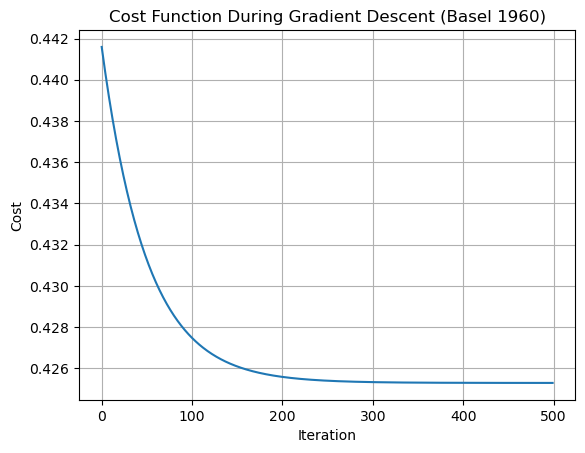

In [35]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Basel 1960)")
plt.grid(True)
plt.show()

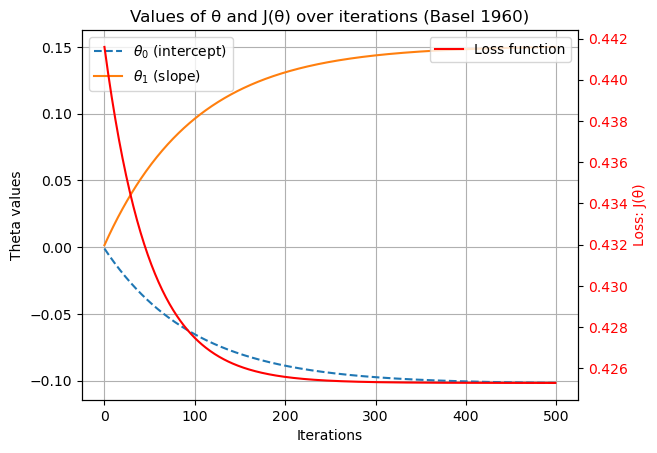

In [36]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label=r'$\theta_0$ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label=r'$\theta_1$ (slope)')
ax1.tick_params(axis='y')
ax1.legend(loc='upper left')
ax1.grid(True)

# Second y-axis for cost function
ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Basel 1960)")
plt.show()

In [37]:
import numpy as np
import plotly.graph_objects as go

# Use your actual final theta values here!
final_theta0 = -0.10  # <-- substitute your value
final_theta1 = 0.15   # <-- substitute your value

theta0_vals = np.linspace(final_theta0 - 0.05, final_theta0 + 0.05, 50)
theta1_vals = np.linspace(final_theta1 - 0.05, final_theta1 + 0.05, 50)
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)

cost_vals = np.zeros(T0.shape)
for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1, colorscale='Plasma', colorbar=dict(title="Cost"))])
fig.update_layout(
    title='Loss function for different thetas (Basel 1960, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()


## Basel 1990

### Filter Data for Basel 1990

In [40]:
# Filter to only rows from 1990
data_1990 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("1990")].copy()

# Convert DATE to datetime and extract day of year
data_1990["DATE"] = pd.to_datetime(data_1990["DATE"], format="%Y%m%d")
data_1990["DAY_OF_YEAR"] = data_1990["DATE"].dt.dayofyear

# Prepare X (feature) and y (target)
X = data_1990["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_1990["BASEL_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (365, 1)
y shape: (365, 1)


### Add Intercept to Feature Matrix

In [42]:
# Add column of ones for intercept (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]  # Now X_b has shape (m, 2)
print(X_b[:5])  # Preview first 5 rows

[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


### Standardize Feature (Optional but helps)

In [44]:
# Standardize day-of-year feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std  # Only column 1

print(X_b[:5])

[[ 1.         -1.72731195]
 [ 1.         -1.71782122]
 [ 1.         -1.7083305 ]
 [ 1.         -1.69883977]
 [ 1.         -1.68934905]]


### Run Gradient Descent

In [46]:
theta = np.zeros((2, 1))  # Initialize parameters
alpha = 0.01              # Learning rate (start with 0.01)
num_iterations = 500      # Try 500, increase if not converging

theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): 0.07039500972259828
theta_1 (slope): 0.07797772463510962


### Plot Cost Function Over Iterations

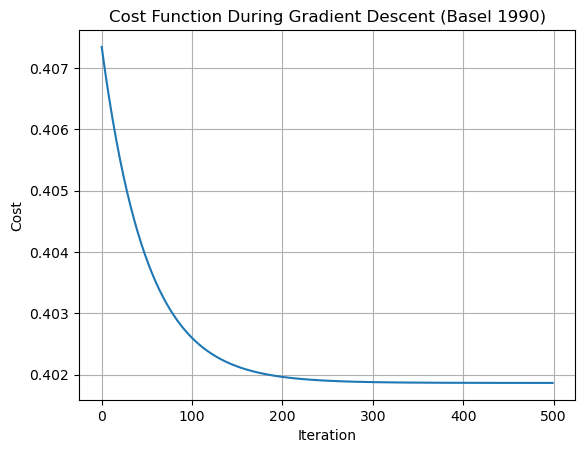

In [48]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Basel 1990)")
plt.grid(True)
plt.show()

### Plot Theta Values and Cost Over Iterations

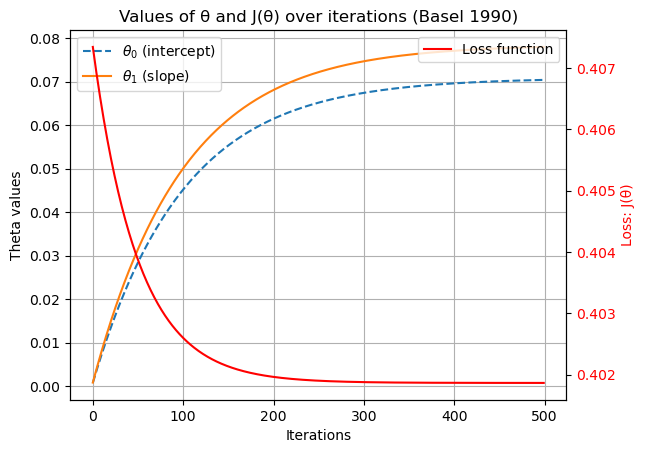

In [50]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label=r'$\theta_0$ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label=r'$\theta_1$ (slope)')
ax1.tick_params(axis='y')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Basel 1990)")
plt.show()

### Plot 3D Surface of Cost Function (Zoomed Near Optimum)

In [52]:
import plotly.graph_objects as go

# Use your actual final theta values below after running the previous block!
final_theta0 = 0.070
final_theta1 = 0.078

theta0_vals = np.linspace(final_theta0 - 0.05, final_theta0 + 0.05, 50)
theta1_vals = np.linspace(final_theta1 - 0.05, final_theta1 + 0.05, 50)
T0, T1 = np.meshgrid(theta0_vals, theta1_vals)

cost_vals = np.zeros(T0.shape)
for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1, colorscale='Plasma', colorbar=dict(title="Cost"))])
fig.update_layout(
    title='Loss function for different thetas (Basel 1990, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

## Basel 2017

### Filter Data for Basel 2017

In [277]:
# Filter for 2017 rows (Basel)
data_2017 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("2017")].copy()

### Prepare Feature and Target Variables

In [280]:
# Convert DATE to datetime and extract day of year
data_2017["DATE"] = pd.to_datetime(data_2017["DATE"], format="%Y%m%d")
data_2017["DAY_OF_YEAR"] = data_2017["DATE"].dt.dayofyear

# X = feature (day of year), y = target (Basel mean temperature)
X = data_2017["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_2017["BASEL_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (365, 1)
y shape: (365, 1)


### Add Intercept Column to X

In [283]:
# Add a column of 1s for the intercept term (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]
print("First 5 rows of X_b:")
print(X_b[:5])

First 5 rows of X_b:
[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


### Standardize the Feature (Day of Year)

In [287]:
# Standardize the DAY_OF_YEAR feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std

### Initialize Parameters and Run Gradient Descent

In [290]:
# Set initial theta, learning rate (alpha), and number of iterations
theta = np.zeros((2, 1))
alpha = 0.01
num_iterations = 500

# Run gradient descent (assuming your gradient_descent function is already defined)
theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): 0.13955241776451413
theta_1 (slope): 0.17111683939454203


### Plot Cost Function Over Iterations

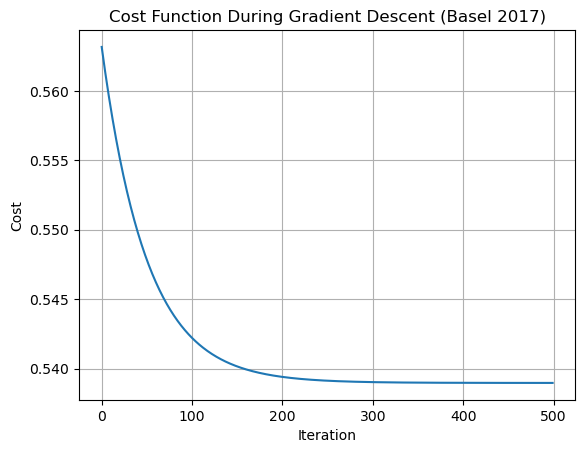

In [293]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Basel 2017)")
plt.grid(True)
plt.show()

### Plot Theta Values and Loss Over Iterations

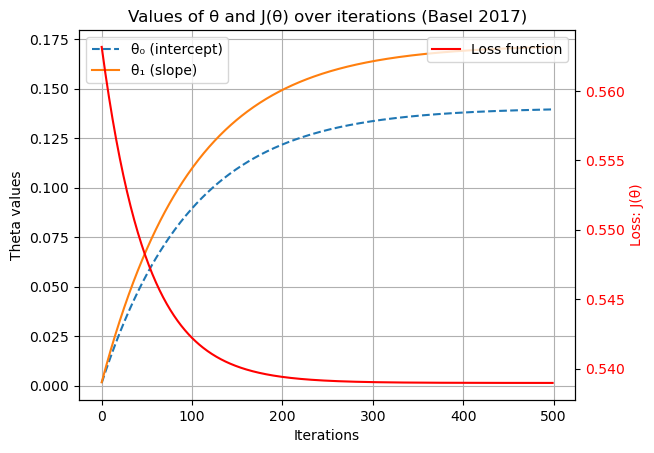

In [296]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label='θ₀ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label='θ₁ (slope)')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Basel 2017)")
plt.show()

###  3D Surface Plot of Cost Function (Basel 2017)

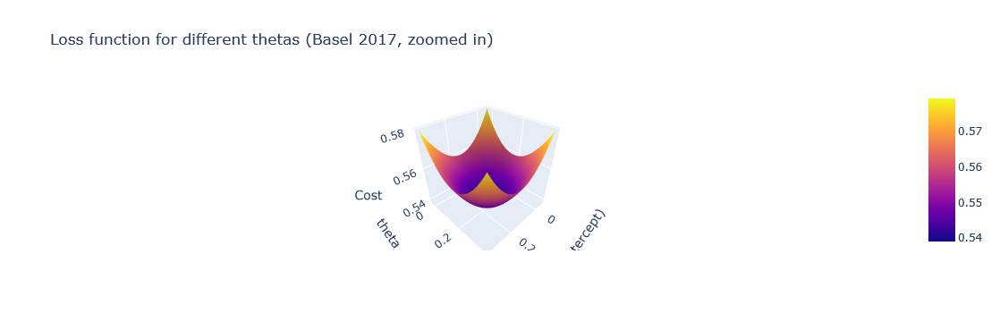

In [299]:
import plotly.graph_objs as go

# Automatically center around your computed thetas
theta0_range = np.linspace(theta[0][0] - 0.2, theta[0][0] + 0.2, 100)
theta1_range = np.linspace(theta[1][0] - 0.2, theta[1][0] + 0.2, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)
cost_vals = np.zeros(T0.shape)

for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1)])
fig.update_layout(
    title='Loss function for different thetas (Basel 2017, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

## Madrid 1960

### Filter Data for Madrid 1960

In [55]:
# Filter rows for 1960 for Madrid
data_1960 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("1960")].copy()

### Prepare Feature and Target Variables

In [57]:
# Convert DATE to datetime and extract day of year
data_1960["DATE"] = pd.to_datetime(data_1960["DATE"], format="%Y%m%d")
data_1960["DAY_OF_YEAR"] = data_1960["DATE"].dt.dayofyear

# X = feature (day of year), y = target (Madrid mean temperature)
X = data_1960["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_1960["MADRID_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (366, 1)
y shape: (366, 1)


### Add Intercept Column to X

In [59]:
# Add a column of 1s for the intercept term (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]
print("First 5 rows of X_b:")
print(X_b[:5])

First 5 rows of X_b:
[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


### Standardize the Feature (Day of Year)

In [61]:
# Standardize the DAY_OF_YEAR feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std

### Initialize Parameters and Run Gradient Descent

In [63]:
# Set initial theta, learning rate (alpha), and number of iterations
theta = np.zeros((2, 1))
alpha = 0.01
num_iterations = 500

# Run gradient descent (assuming your gradient_descent function is already defined)
theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): -0.12962265228413947
theta_1 (slope): 0.10005178719648014


### Plot Cost Function Over Iterations

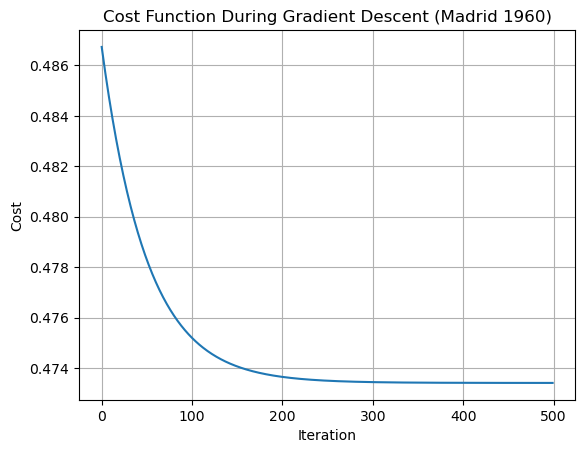

In [65]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Madrid 1960)")
plt.grid(True)
plt.show()

### Plot Theta Values and Loss Over Iterations

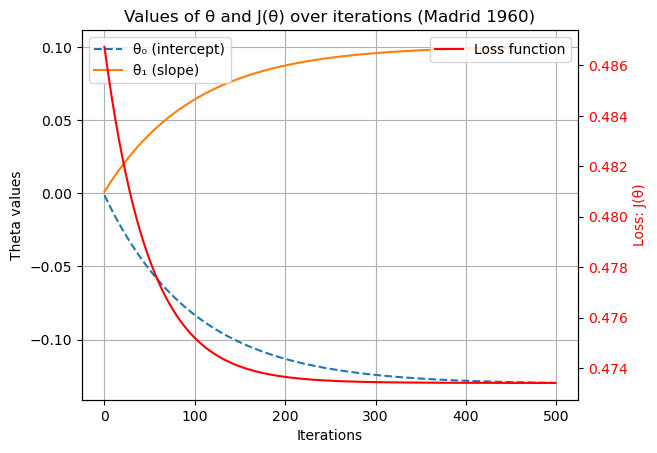

In [67]:
fig, ax1 = plt.subplots()

# Plot theta values
ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label='θ₀ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label='θ₁ (slope)')
ax1.legend(loc='upper left')
ax1.grid(True)

# Plot cost on the right y-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Madrid 1960)")
plt.show()

### 3D Surface Plot of Cost Function

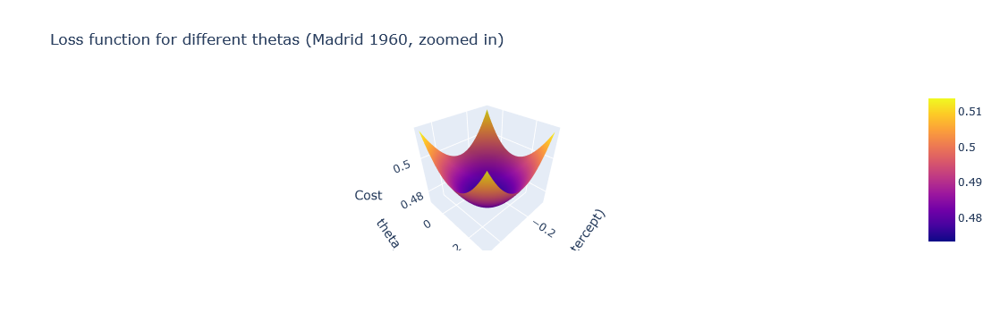

In [69]:
# Create theta ranges centered on your optimized values
theta0_range = np.linspace(theta[0][0] - 0.2, theta[0][0] + 0.2, 100)
theta1_range = np.linspace(theta[1][0] - 0.2, theta[1][0] + 0.2, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)
cost_vals = np.zeros(T0.shape)

# Compute cost for each theta pair
for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

# Plot surface with color bar
import plotly.graph_objs as go
fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1)])
fig.update_layout(
    title='Loss function for different thetas (Madrid 1960, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

## Madrid 1990

### Filter Data for Madrid 1990

In [72]:
# Filter for 1990 rows (Madrid)
data_1990 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("1990")].copy()

### Prepare Feature and Target Variables

In [114]:
# Convert DATE to datetime and extract day of year
data_1990["DATE"] = pd.to_datetime(data_1990["DATE"], format="%Y%m%d")
data_1990["DAY_OF_YEAR"] = data_1990["DATE"].dt.dayofyear

# X = feature (day of year), y = target (Madrid mean temperature)
X = data_1990["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_1990["MADRID_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (365, 1)
y shape: (365, 1)


### Add Intercept Column to X

In [117]:
# Add a column of 1s for the intercept term (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]
print("First 5 rows of X_b:")
print(X_b[:5])

First 5 rows of X_b:
[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


### Standardize the Feature (Day of Year)

In [120]:
# Standardize the DAY_OF_YEAR feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std

### Initialize Parameters and Run Gradient Descent

In [123]:
# Set initial theta, learning rate (alpha), and number of iterations
theta = np.zeros((2, 1))
alpha = 0.01
num_iterations = 500

# Run gradient descent (assuming your gradient_descent function is already defined)
theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): 0.0633344335503174
theta_1 (slope): 0.11616164174098903


### Plot Cost Function Over Iterations

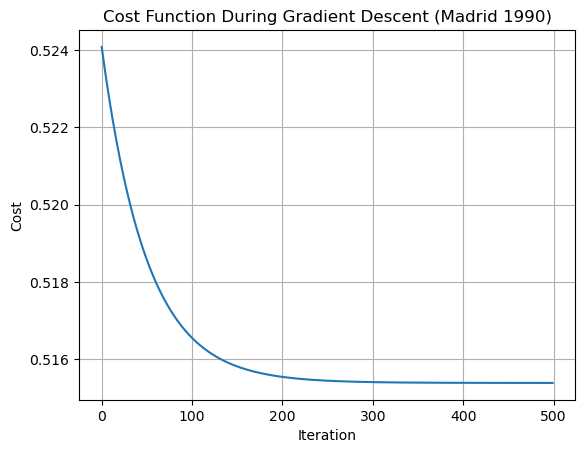

In [126]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Madrid 1990)")
plt.grid(True)
plt.show()

### Plot Theta Values and Loss Over Iterations

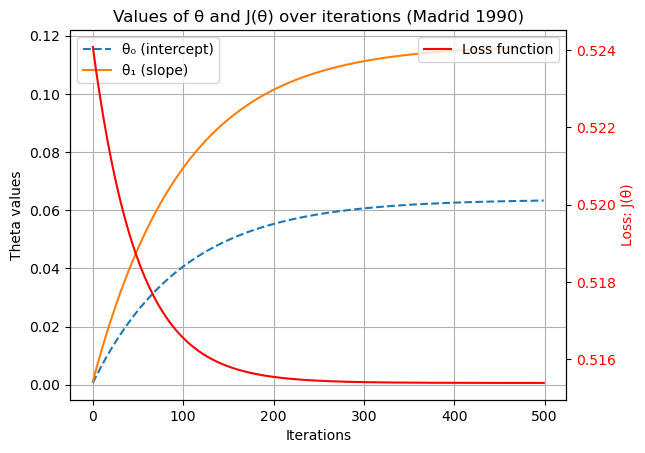

In [129]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label='θ₀ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label='θ₁ (slope)')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Madrid 1990)")
plt.show()

### 3D Surface Plot of Cost Function (Madrid 1990)

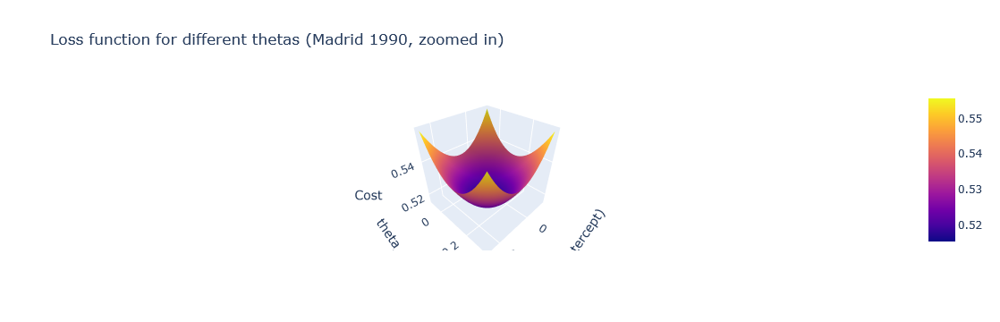

In [134]:
import plotly.graph_objs as go

# Automatically center around your computed thetas
theta0_range = np.linspace(theta[0][0] - 0.2, theta[0][0] + 0.2, 100)
theta1_range = np.linspace(theta[1][0] - 0.2, theta[1][0] + 0.2, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)
cost_vals = np.zeros(T0.shape)

for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1)])
fig.update_layout(
    title='Loss function for different thetas (Madrid 1990, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

### Madrid 2017

## Filter Data for Madrid 2017

In [138]:
# Filter for 2017 rows (Madrid)
data_2017 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("2017")].copy()

## Prepare Feature and Target Variables

In [141]:
# Convert DATE to datetime and extract day of year
data_2017["DATE"] = pd.to_datetime(data_2017["DATE"], format="%Y%m%d")
data_2017["DAY_OF_YEAR"] = data_2017["DATE"].dt.dayofyear

# X = feature (day of year), y = target (Madrid mean temperature)
X = data_2017["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_2017["MADRID_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (365, 1)
y shape: (365, 1)


## Add Intercept Column to X

In [144]:
# Add a column of 1s for the intercept term (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]
print("First 5 rows of X_b:")
print(X_b[:5])

First 5 rows of X_b:
[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


## Standardize the Feature (Day of Year)

In [147]:
# Standardize the DAY_OF_YEAR feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std

## Initialize Parameters and Run Gradient Descent

In [150]:
# Set initial theta, learning rate (alpha), and number of iterations
theta = np.zeros((2, 1))
alpha = 0.01
num_iterations = 500

# Run gradient descent (assuming your gradient_descent function is already defined)
theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): 0.2417402608313466
theta_1 (slope): 0.17315457336571438


## Plot Cost Function Over Iterations

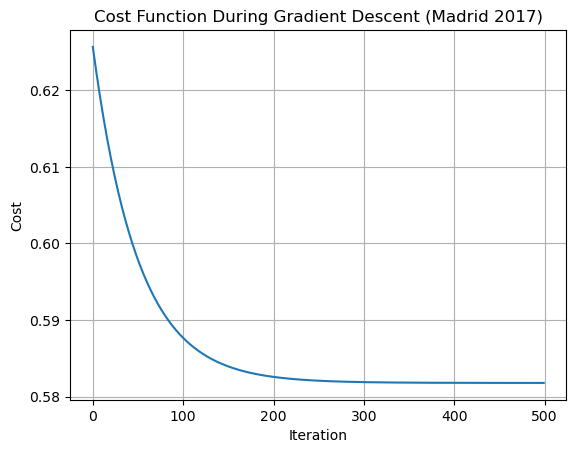

In [153]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Madrid 2017)")
plt.grid(True)
plt.show()

## Plot Theta Values and Loss Over Iterations

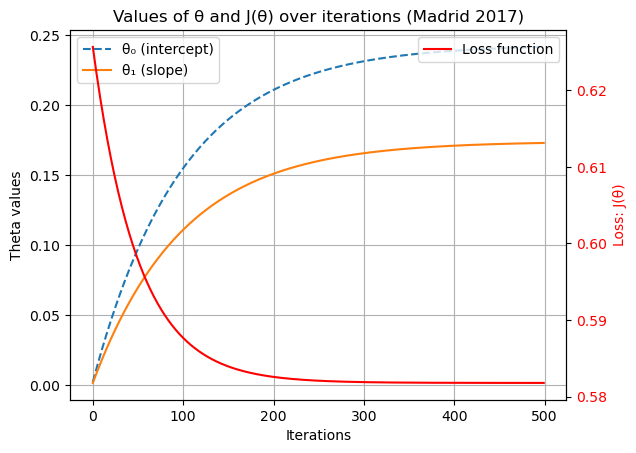

In [156]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label='θ₀ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label='θ₁ (slope)')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Madrid 2017)")
plt.show()

## 3D Surface Plot of Cost Function (Madrid 2017)

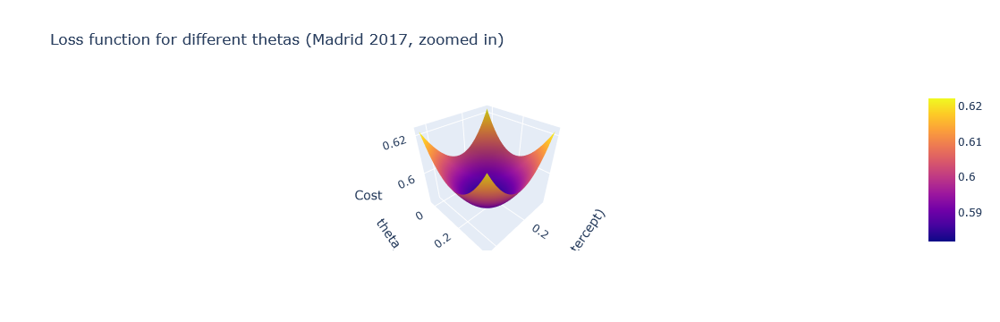

In [159]:
import plotly.graph_objs as go

# Automatically center around your computed thetas
theta0_range = np.linspace(theta[0][0] - 0.2, theta[0][0] + 0.2, 100)
theta1_range = np.linspace(theta[1][0] - 0.2, theta[1][0] + 0.2, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)
cost_vals = np.zeros(T0.shape)

for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1)])
fig.update_layout(
    title='Loss function for different thetas (Madrid 2017, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

## Stockholm 1960

### Filter Data for Stockholm 1960

In [163]:
# Filter for 1960 rows (Stockholm)
data_1960 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("1960")].copy()

### Prepare Feature and Target Variables

In [166]:
# Convert DATE to datetime and extract day of year
data_1960["DATE"] = pd.to_datetime(data_1960["DATE"], format="%Y%m%d")
data_1960["DAY_OF_YEAR"] = data_1960["DATE"].dt.dayofyear

# X = feature (day of year), y = target (Stockholm mean temperature)
X = data_1960["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_1960["STOCKHOLM_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (366, 1)
y shape: (366, 1)


### Add Intercept Column to X

In [169]:
# Add a column of 1s for the intercept term (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]
print("First 5 rows of X_b:")
print(X_b[:5])

First 5 rows of X_b:
[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


### Standardize the Feature (Day of Year)

In [172]:
# Standardize the DAY_OF_YEAR feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std

### Initialize Parameters and Run Gradient Descent

In [175]:
# Set initial theta, learning rate (alpha), and number of iterations
theta = np.zeros((2, 1))
alpha = 0.01
num_iterations = 500

# Run gradient descent (assuming your gradient_descent function is already defined)
theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): -0.09219442431258303
theta_1 (slope): 0.3385793815196841


### Plot Cost Function Over Iterations

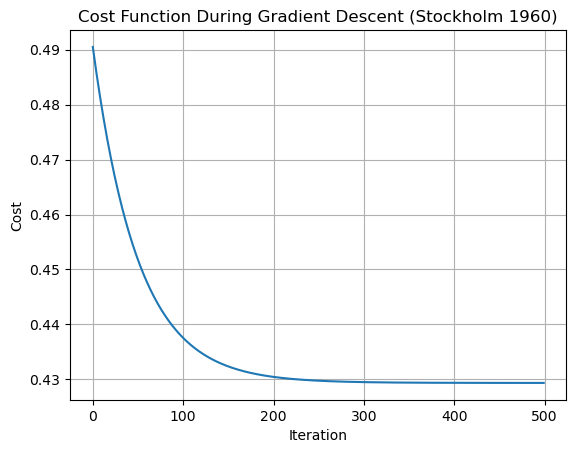

In [179]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Stockholm 1960)")
plt.grid(True)
plt.show()

### Plot Theta Values and Loss Over Iterations

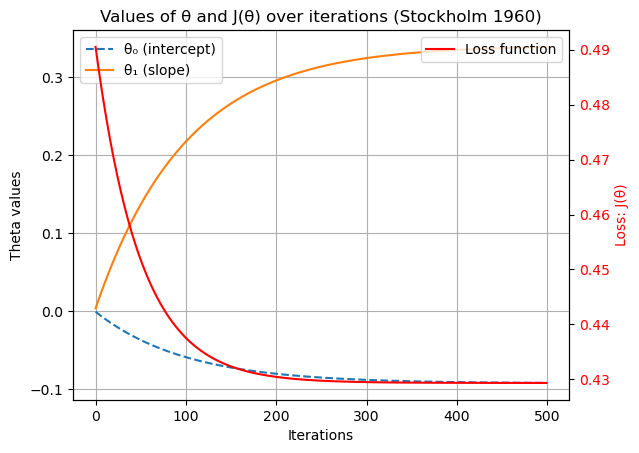

In [182]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label='θ₀ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label='θ₁ (slope)')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Stockholm 1960)")
plt.show()

### 3D Surface Plot of Cost Function (Stockholm 1960)

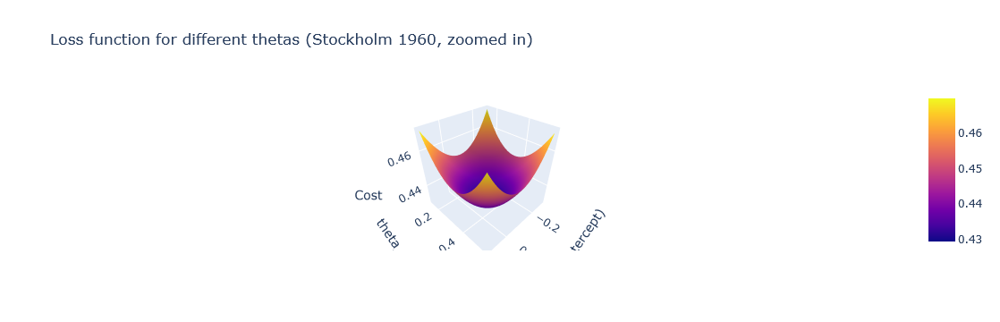

In [185]:
import plotly.graph_objs as go

# Automatically center around your computed thetas
theta0_range = np.linspace(theta[0][0] - 0.2, theta[0][0] + 0.2, 100)
theta1_range = np.linspace(theta[1][0] - 0.2, theta[1][0] + 0.2, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)
cost_vals = np.zeros(T0.shape)

for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1)])
fig.update_layout(
    title='Loss function for different thetas (Stockholm 1960, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

## Stockholm 1990

### Filter Data for Stockholm 1990

In [189]:
# Filter for 1990 rows (Stockholm)
data_1990 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("1990")].copy()

## Prepare Feature and Target Variables

In [192]:
# Convert DATE to datetime and extract day of year
data_1990["DATE"] = pd.to_datetime(data_1990["DATE"], format="%Y%m%d")
data_1990["DAY_OF_YEAR"] = data_1990["DATE"].dt.dayofyear

# X = feature (day of year), y = target (Stockholm mean temperature)
X = data_1990["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_1990["STOCKHOLM_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (365, 1)
y shape: (365, 1)


## Add Intercept Column to X

In [195]:
# Add a column of 1s for the intercept term (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]
print("First 5 rows of X_b:")
print(X_b[:5])

First 5 rows of X_b:
[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


## Standardize the Feature (Day of Year)

In [198]:
# Standardize the DAY_OF_YEAR feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std

### Initialize Parameters and Run Gradient Descent

In [201]:
# Set initial theta, learning rate (alpha), and number of iterations
theta = np.zeros((2, 1))
alpha = 0.01
num_iterations = 500

# Run gradient descent (assuming your gradient_descent function is already defined)
theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): 0.13073786469223075
theta_1 (slope): 0.0432951055668251


### Plot Cost Function Over Iterations

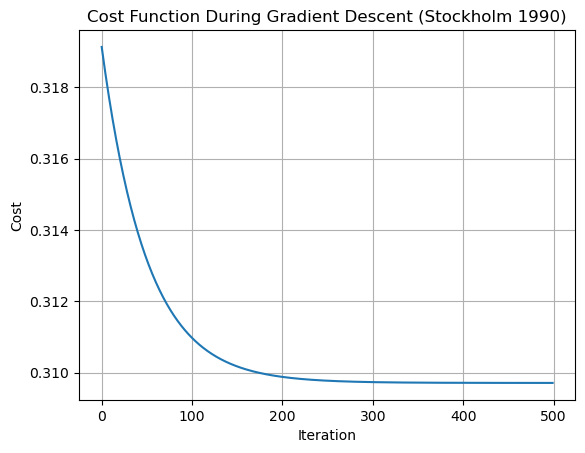

In [205]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Stockholm 1990)")
plt.grid(True)
plt.show()

### Plot Theta Values and Loss Over Iterations

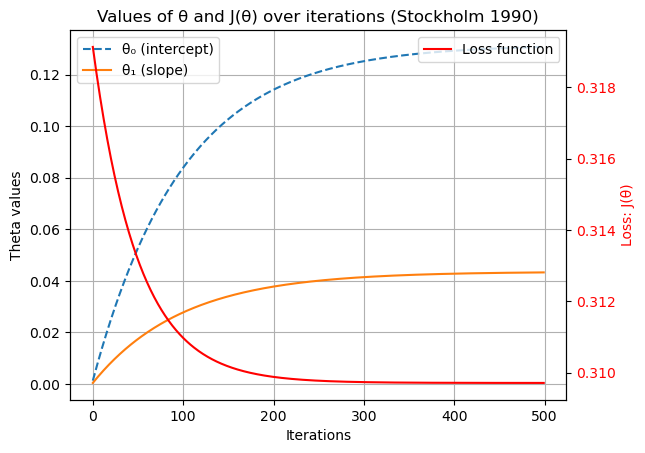

In [208]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label='θ₀ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label='θ₁ (slope)')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Stockholm 1990)")
plt.show()

### 3D Surface Plot of Cost Function (Stockholm 1990)

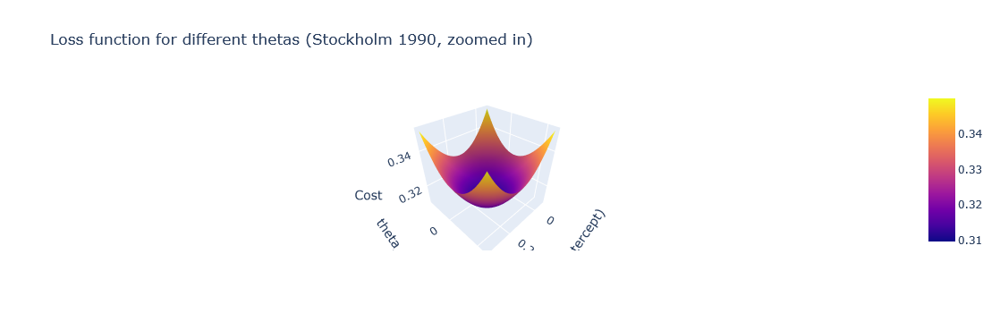

In [211]:
import plotly.graph_objs as go

# Automatically center around your computed thetas
theta0_range = np.linspace(theta[0][0] - 0.2, theta[0][0] + 0.2, 100)
theta1_range = np.linspace(theta[1][0] - 0.2, theta[1][0] + 0.2, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)
cost_vals = np.zeros(T0.shape)

for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1)])
fig.update_layout(
    title='Loss function for different thetas (Stockholm 1990, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

## Stockholm 2017


### Filter Data for Stockholm 2017

In [250]:
# Filter for 2017 rows (Stockholm)
data_2017 = df_scaled[df_scaled["DATE"].astype(str).str.startswith("2017")].copy()

### Prepare Feature and Target Variables

In [254]:
# Convert DATE to datetime and extract day of year
data_2017["DATE"] = pd.to_datetime(data_2017["DATE"], format="%Y%m%d")
data_2017["DAY_OF_YEAR"] = data_2017["DATE"].dt.dayofyear

# X = feature (day of year), y = target (Stockholm mean temperature)
X = data_2017["DAY_OF_YEAR"].values.reshape(-1, 1)
y = data_2017["STOCKHOLM_temp_mean"].values.reshape(-1, 1)

print("X shape:", X.shape)
print("y shape:", y.shape)

X shape: (365, 1)
y shape: (365, 1)


### Add Intercept Column to X

In [257]:
# Add a column of 1s for the intercept term (theta_0)
m = X.shape[0]
X_b = np.c_[np.ones((m, 1)), X]
print("First 5 rows of X_b:")
print(X_b[:5])

First 5 rows of X_b:
[[1. 1.]
 [1. 2.]
 [1. 3.]
 [1. 4.]
 [1. 5.]]


### Standardize the Feature (Day of Year)

In [260]:
# Standardize the DAY_OF_YEAR feature (not the intercept column)
mean = X_b[:, 1].mean()
std = X_b[:, 1].std()
X_b[:, 1] = (X_b[:, 1] - mean) / std

### Initialize Parameters and Run Gradient Descent

In [263]:
# Set initial theta, learning rate (alpha), and number of iterations
theta = np.zeros((2, 1))
alpha = 0.01
num_iterations = 500

# Run gradient descent (assuming your gradient_descent function is already defined)
theta, J_history, theta0_history, theta1_history = gradient_descent(
    X_b, y, theta, alpha=alpha, num_iterations=num_iterations
)

print("Final theta values:")
print("theta_0 (intercept):", theta[0][0])
print("theta_1 (slope):", theta[1][0])

Final theta values:
theta_0 (intercept): 0.0815733913329584
theta_1 (slope): 0.21082933215835795


### Plot Cost Function Over Iterations

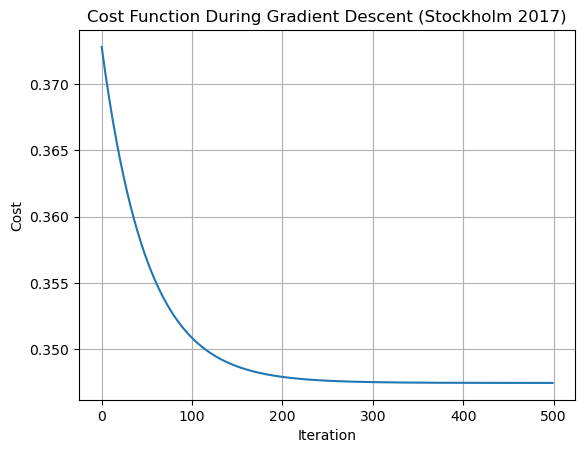

In [266]:
plt.plot(J_history)
plt.xlabel("Iteration")
plt.ylabel("Cost")
plt.title("Cost Function During Gradient Descent (Stockholm 2017)")
plt.grid(True)
plt.show()

### Plot Theta Values and Loss Over Iterations

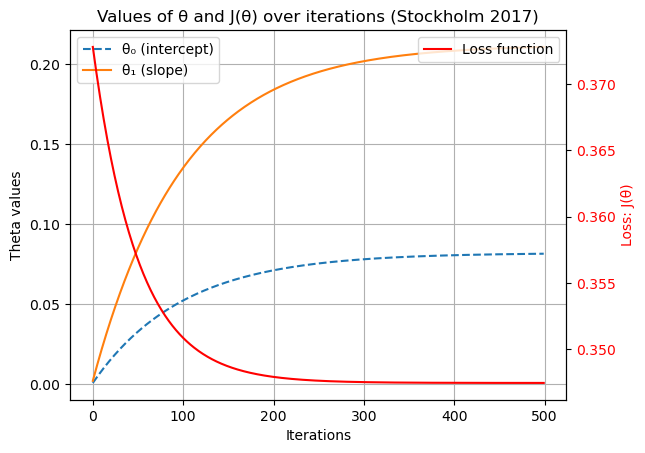

In [269]:
fig, ax1 = plt.subplots()

ax1.set_xlabel('Iterations')
ax1.set_ylabel('Theta values')
ax1.plot(theta0_history, label='θ₀ (intercept)', linestyle='dashed')
ax1.plot(theta1_history, label='θ₁ (slope)')
ax1.legend(loc='upper left')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.set_ylabel('Loss: J(θ)', color='red')
ax2.plot(J_history, color='red', label='Loss function')
ax2.tick_params(axis='y', labelcolor='red')
ax2.legend(loc='upper right')

plt.title("Values of θ and J(θ) over iterations (Stockholm 2017)")
plt.show()

### 3D Surface Plot of Cost Function (Stockholm 2017)

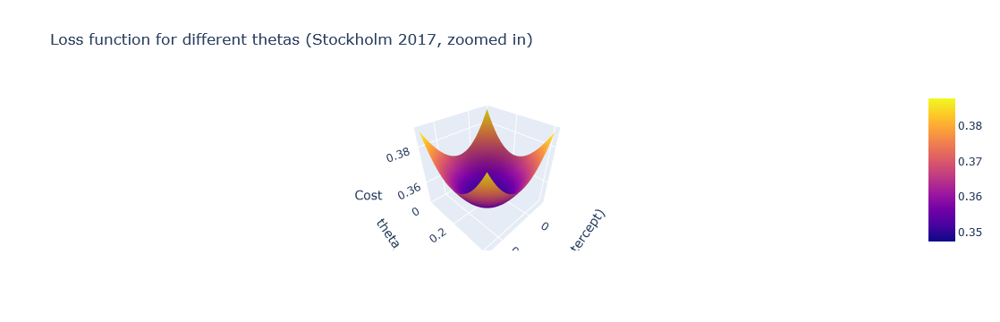

In [272]:
import plotly.graph_objs as go

# Automatically center around your computed thetas
theta0_range = np.linspace(theta[0][0] - 0.2, theta[0][0] + 0.2, 100)
theta1_range = np.linspace(theta[1][0] - 0.2, theta[1][0] + 0.2, 100)
T0, T1 = np.meshgrid(theta0_range, theta1_range)
cost_vals = np.zeros(T0.shape)

for i in range(T0.shape[0]):
    for j in range(T0.shape[1]):
        t = np.array([[T0[i, j]], [T1[i, j]]])
        cost_vals[i, j] = compute_cost(X_b, y, t)

fig = go.Figure(data=[go.Surface(z=cost_vals, x=T0, y=T1)])
fig.update_layout(
    title='Loss function for different thetas (Stockholm 2017, zoomed in)',
    scene=dict(
        xaxis_title='theta_0 (intercept)',
        yaxis_title='theta_1 (slope)',
        zaxis_title='Cost'
    )
)
fig.show()

## Other observations

In [302]:
# Years you care about (as strings)
years = ["1960", "1990", "2017"]

# Weather stations
stations = ["BASEL", "MADRID", "STOCKHOLM"]

# Prepare empty dicts to store results
mean_temps = {}
min_temps = {}
max_temps = {}

for city in stations:
    mean_temps[city] = []
    min_temps[city] = []
    max_temps[city] = []
    for yr in years:
        # Filter for year
        subset = df_scaled[df_scaled["DATE"].astype(str).str.startswith(yr)]
        mean_temps[city].append(subset[f"{city}_temp_mean"].mean())
        min_temps[city].append(subset[f"{city}_temp_min"].min())
        max_temps[city].append(subset[f"{city}_temp_max"].max())

# Print the results
print("Mean Temperatures:")
for city in stations:
    print(f"{city}: {mean_temps[city]}")

print("\nMin Temperatures:")
for city in stations:
    print(f"{city}: {min_temps[city]}")

print("\nMax Temperatures:")
for city in stations:
    print(f"{city}: {max_temps[city]}")

Mean Temperatures:
BASEL: [-0.10231659567460615, 0.0708605980806626, 0.14047540905760347]
MADRID: [-0.13047996870589632, 0.06375332368247069, 0.24333911636900524]
STOCKHOLM: [-0.09280419268689738, 0.13160255706174337, 0.08211291283429945]

Min Temperatures:
BASEL: [-3.911265784375793, -1.9186167736024824, -2.562395684775398]
MADRID: [-2.337406413096464, -1.8715499781791465, -2.026835456484919]
STOCKHOLM: [-2.6139678778988684, -1.5590321476094493, -2.4270172421513765]

Max Temperatures:
BASEL: [1.9957092734260995, 2.2018814021179103, 2.2018814021179103]
MADRID: [1.8764488915360915, 1.9923687716034648, 2.3401284118055843]
STOCKHOLM: [1.733912576086743, 1.931700120545752, 1.9976293020320883]
